<a href="https://colab.research.google.com/github/Saurabh-Hase/Bike-sharing-Regression/blob/main/Copy_of_Bike_Sharing_Demand_Prediction_Capstone_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <b><u> Project Title : Seoul Bike Sharing Demand Prediction </u></b>

## <b> Problem Description </b>

### Currently Rental bikes are introduced in many urban cities for the enhancement of mobility comfort. It is important to make the rental bike available and accessible to the public at the right time as it lessens the waiting time. Eventually, providing the city with a stable supply of rental bikes becomes a major concern. The crucial part is the prediction of bike count required at each hour for the stable supply of rental bikes.


## <b> Data Description </b>

### <b> The dataset contains weather information (Temperature, Humidity, Windspeed, Visibility, Dewpoint, Solar radiation, Snowfall, Rainfall), the number of bikes rented per hour and date information.</b>


### <b>Attribute Information: </b>

* ### Date : year-month-day
* ### Rented Bike count - Count of bikes rented at each hour
* ### Hour - Hour of he day
* ### Temperature-Temperature in Celsius
* ### Humidity - %
* ### Windspeed - m/s
* ### Visibility - 10m
* ### Dew point temperature - Celsius
* ### Solar radiation - MJ/m2
* ### Rainfall - mm
* ### Snowfall - cm
* ### Seasons - Winter, Spring, Summer, Autumn
* ### Holiday - Holiday/No holiday
* ### Functional Day - NoFunc(Non Functional Hours), Fun(Functional hours)

In [1]:
import pandas as pd 
import numpy as np

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
df=pd.read_csv('/content/drive/MyDrive/Copy of SeoulBikeData.csv',encoding= 'unicode_escape')
df.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

In [5]:
df.describe()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068
std,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746
min,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000
25%,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000
50%,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000
75%,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000
max,3556.000000,23.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.000000,8.800000


In [6]:
df.shape

(8760, 14)

In [7]:
df['Hour'].unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23])

In [8]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     | 21.8 MB 157 kB/s
     |████████████████████████████████| 11.1 MB 15.7 MB/s 
     |████████████████████████████████| 596 kB 60.3 MB/s 
     |████████████████████████████████| 102 kB 86.1 MB/s 
     |████████████████████████████████| 690 kB 71.2 MB/s 
     |████████████████████████████████| 4.7 MB 72.5 MB/s 
     |████████████████████████████████| 62 kB 2.1 MB/s 
     |████████████████████████████████| 812 kB 78.6 MB/s 
     |████████████████████████████████| 38.1 MB 1.2 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.2.0-py2.py3-none-any.whl size=262599 sha256=9af1669e03d98d3bbcd7e2b045686f605f55148a8bdca68d10a981050535af62
  Stored in directory: /tmp/pip-ephem-wheel-cache-q7e6t1_4/wheels/cc/d5/09/083fb07c9363a2f45854b0e3a7de7d7c560f07da74b9e9769d
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=2dfa967a952e416457001b765

In [9]:
from pandas_profiling import ProfileReport

In [10]:
# If code not run install following
#!pip install pyyaml==5.4.1

In [11]:
profile = ProfileReport(df, title=' Bike Sharing Demand Prediction', html={'style':{'full_width':True}})

In [12]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [13]:
profile.to_file('/content/drive/MyDrive/Bike Sharing Demand Prediction.html')


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# Lets import dtale library


In [14]:
# ! pip install -U dtale

In [15]:
# !pip install pyyaml==5.4.1

In [16]:
# !pip install pyngrok==4.1.1


In [17]:
# from pyngrok import ngrok

# # Open a HTTP tunnel on the default port 80
# # <NgrokTunnel: "http://<public_sub>.ngrok.io" -> "http://localhost:80">
# http_tunnel = ngrok.connect()
# # # Open a SSH tunnel
# # # <NgrokTunnel: "tcp://0.tcp.ngrok.io:12345" -> "localhost:22">
# ssh_tunnel = ngrok.connect(22, "tcp")

In [18]:
# import dtale
# import dtale.app as dtale_app

# dtale_app.USE_NGROK= True
# dtale.show(df)

In [19]:
# import pandas as pd
# import dtale
# import dtale.app as dtale_app

# dtale_app.USE_COLAB = True 
# dtale.show(df)

In [20]:
# dtale.show(df, host='localhost')



---



---



---



---



In [21]:
pip install sweetviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 15.1 MB 10.9 MB/s 


In [22]:
import sweetviz 

In [23]:
my_report = sweetviz.analyze([df, "df"],target_feat='Rented Bike Count')

                                             |          | [  0%]   00:00 -> (? left)

In [24]:
my_report.show_html('Report.html')

Report Report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



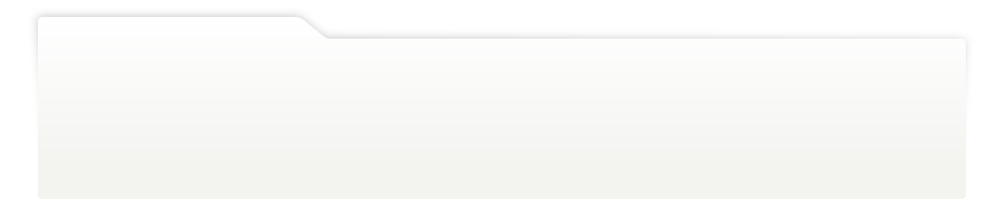
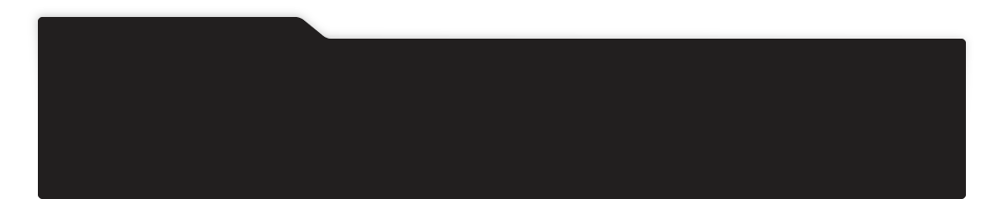
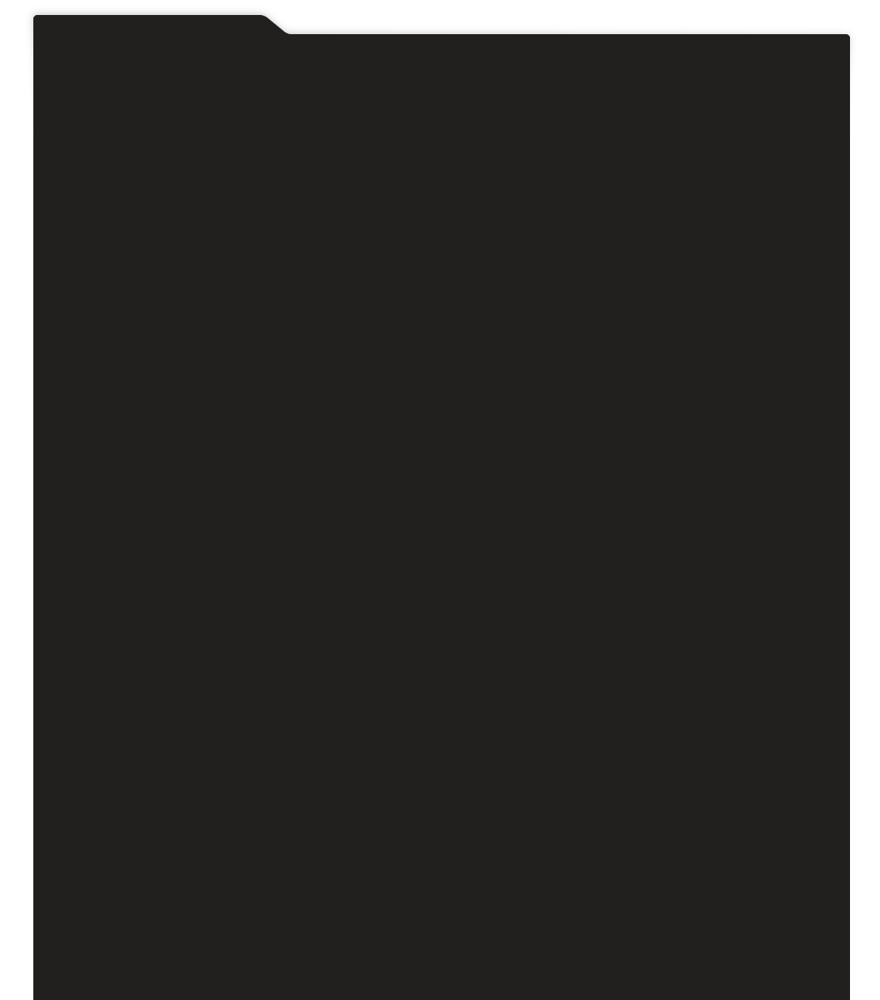
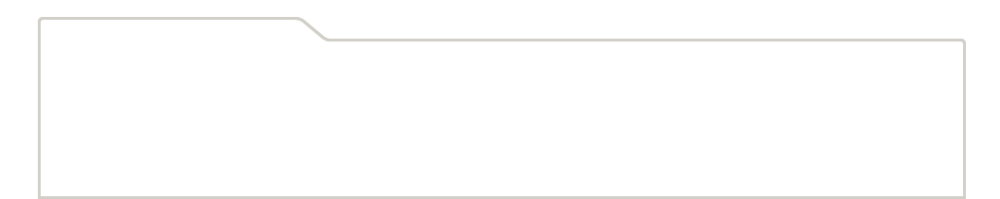
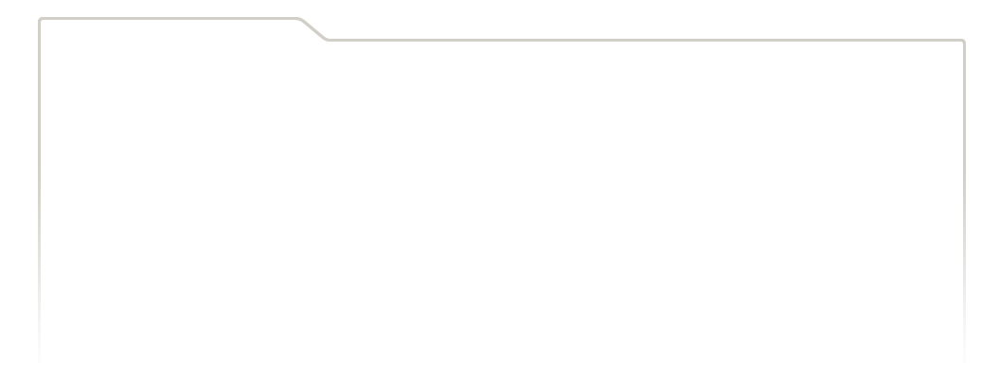
...
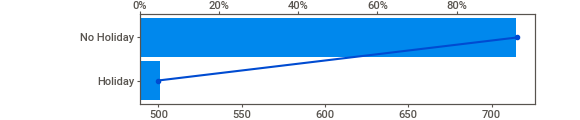
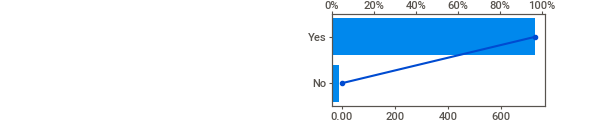
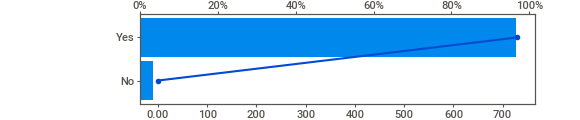
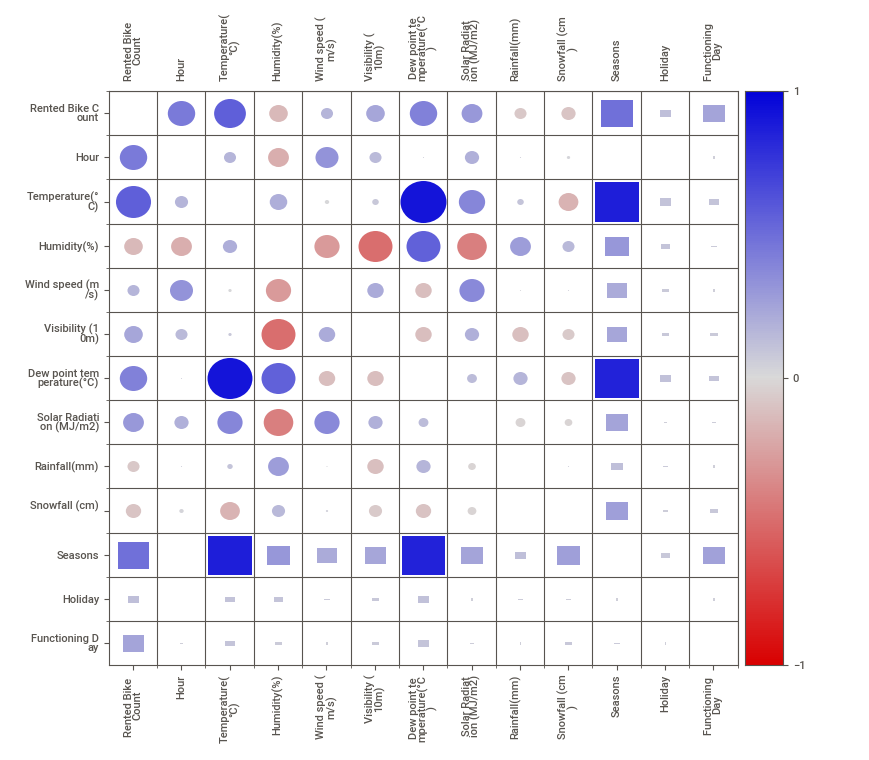
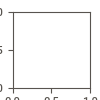

In [25]:
import IPython
IPython.display.HTML('Report.html')



---



---



---



In [26]:
df.isnull().sum()

Date                         0
Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
dtype: int64

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

In [28]:
df['date_column'] = pd.to_datetime(df['Date'])

In [29]:
df['Dates'] = df['date_column'].dt.date

In [30]:
df['Month'] = pd.DatetimeIndex(df['date_column']).month

In [31]:
df['Year'] = pd.DatetimeIndex(df['date_column']).year

In [32]:
df['day'] = df.date_column.dt.day

In [33]:
df['weekday']=df.date_column.dt.weekday

In [34]:
df['weekday'].unique()

array([3, 6, 2, 4, 0, 5, 1])

In [35]:
df['day_of_week'] = df['date_column'].dt.day_name()

In [36]:
df.head(1)

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),...,Seasons,Holiday,Functioning Day,date_column,Dates,Month,Year,day,weekday,day_of_week
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,...,Winter,No Holiday,Yes,2017-01-12,2017-01-12,1,2017,12,3,Thursday


In [37]:
df= df.drop(['Date','Dates','date_column','weekday'], axis=1)

In [38]:
df.head(1)

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Month,Year,day,day_of_week
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,1,2017,12,Thursday


In [39]:
import seaborn as sns

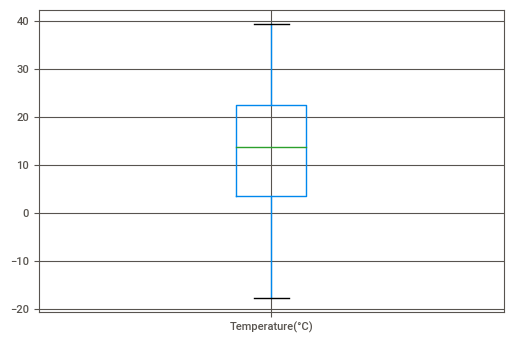

In [40]:
df.boxplot(column=['Temperature(°C)',])

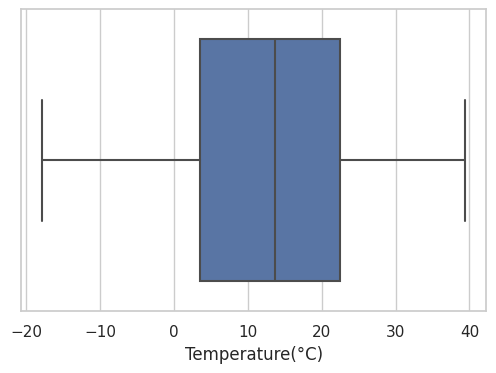

In [41]:

sns.set_theme(style="whitegrid")
ax = sns.boxplot(x=df["Temperature(°C)"])


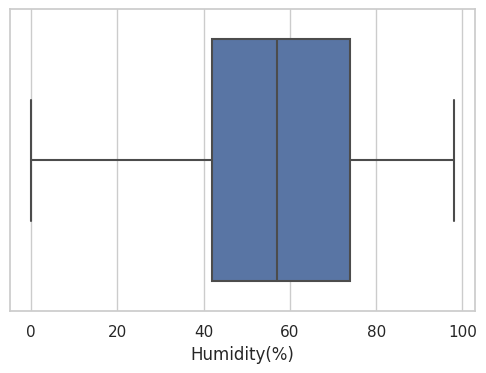

In [42]:
ax = sns.boxplot(x=df["Humidity(%)"])

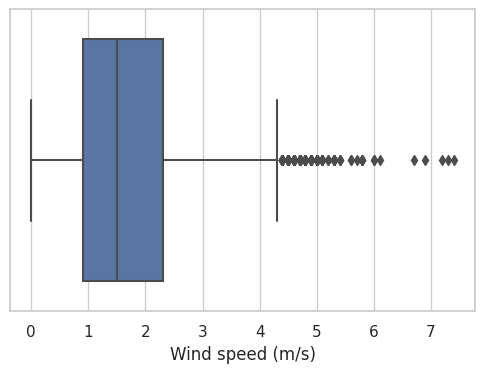

In [43]:
ax = sns.boxplot(x=df["Wind speed (m/s)"])

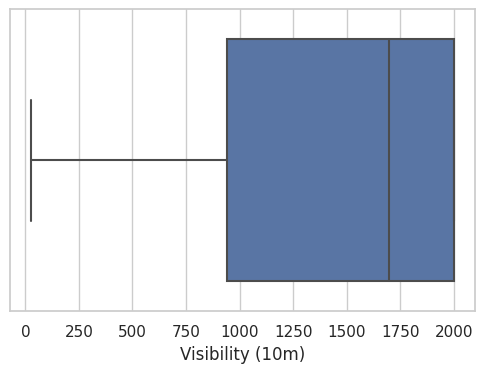

In [44]:
ax = sns.boxplot(x=df["Visibility (10m)"])

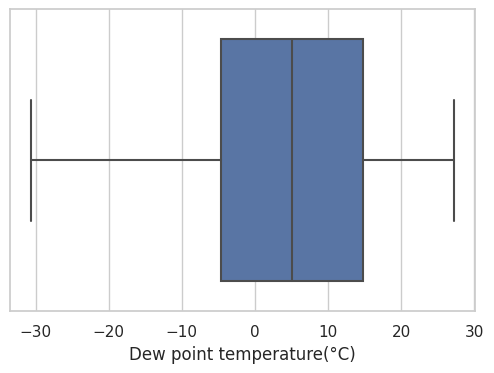

In [45]:
ax = sns.boxplot(x=df["Dew point temperature(°C)"])

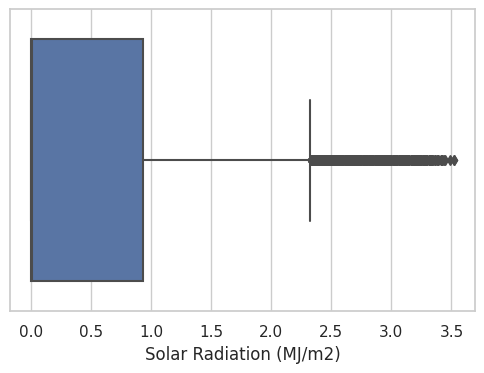

In [46]:
ax = sns.boxplot(x=df["Solar Radiation (MJ/m2)"])	

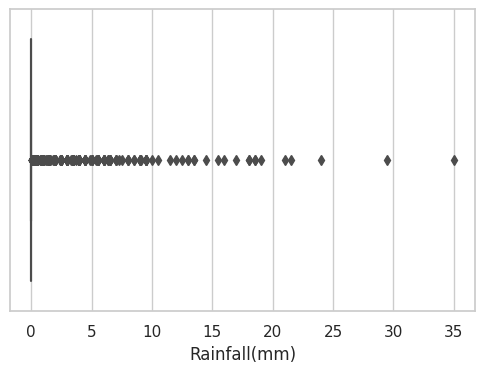

In [47]:
ax= sns.boxplot(x=df["Rainfall(mm)"])	

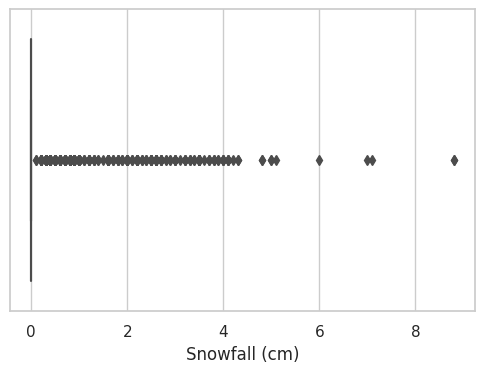

In [48]:
ax=sns.boxplot(x=df["Snowfall (cm)"])	

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


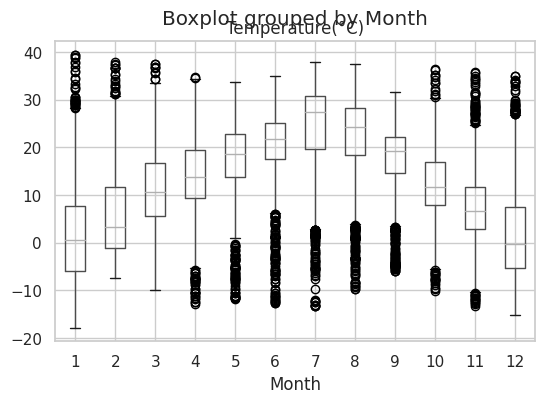

In [49]:
df.boxplot(column='Temperature(°C)',by='Month')

it looklikes there is no outlier in this dataset


---



---

\

In [50]:
df.head(1)

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Month,Year,day,day_of_week
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,1,2017,12,Thursday


In [51]:
numeric_features = df.describe().columns
numeric_features

Index(['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Month',
       'Year', 'day'],
      dtype='object')

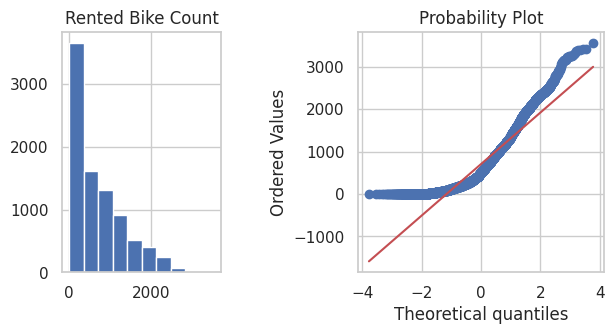

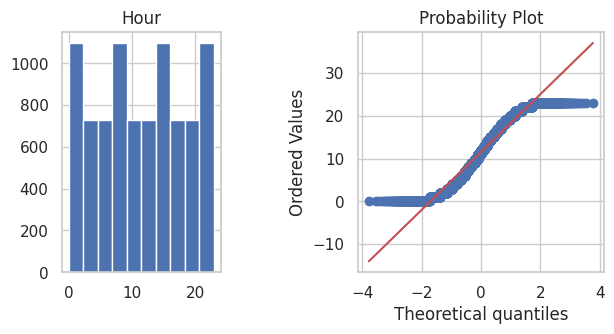

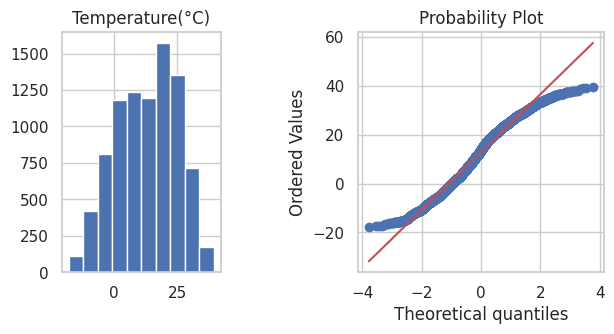

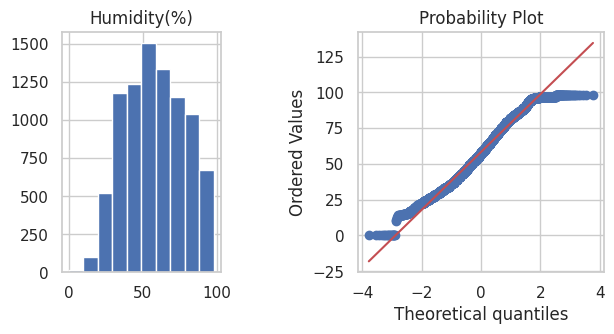

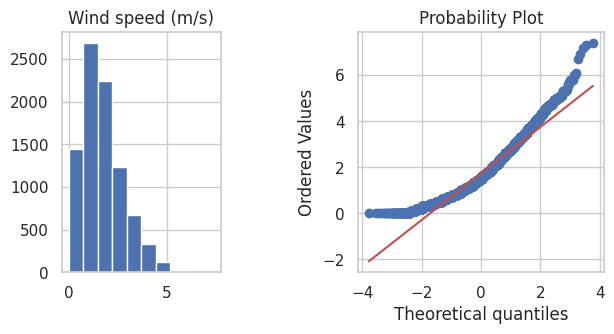

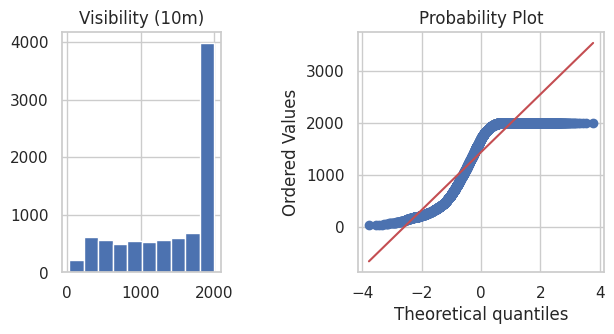

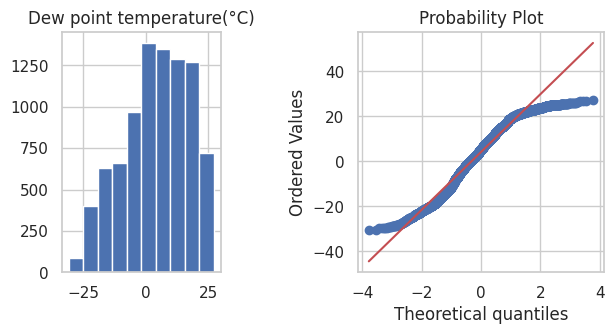

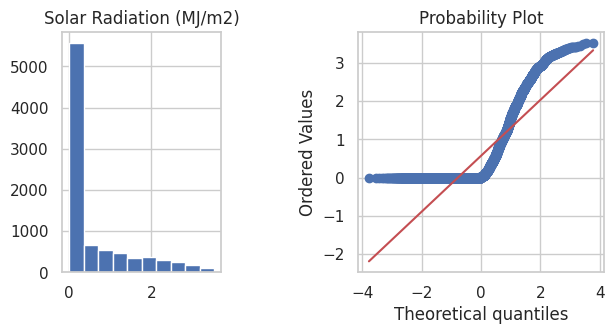

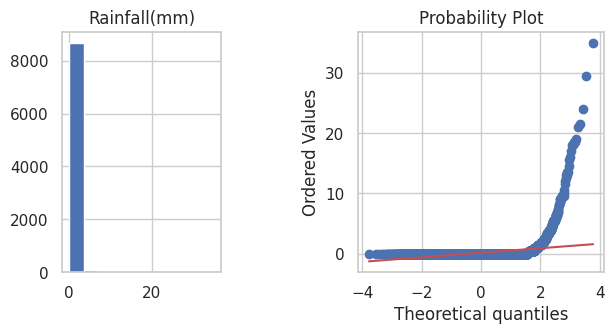

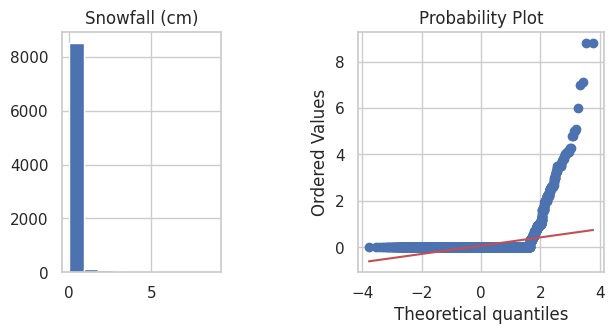

In [52]:
# checking distribution and data is skewed or not
import scipy.stats as stats
import matplotlib.pyplot as plt


def plotvariable(df,variable):
  plt.figure(figsize=(7,7))
  plt.subplot(2,3,1)  #means in sub plot 2 row , 3 cloumns and first plot
  df[variable].hist(bins=10)
  plt.title(col)

   ## Q-Q plot
  plt.subplot(2,2,2)
  stats.probplot(df[variable],dist='norm',plot=plt)
  plt.show()

for col in numeric_features[0:10]:
  plotvariable(df,col)
  


In [64]:
df_log=df.copy()

In [65]:
df_log.head()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Month,Year,day,day_of_week
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,1,2017,12,Thursday
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,1,2017,12,Thursday
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,1,2017,12,Thursday
3,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,1,2017,12,Thursday
4,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,1,2017,12,Thursday


In [66]:
numeric_features_log = df_log.describe().columns
numeric_features_log

Index(['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Month',
       'Year', 'day'],
      dtype='object')

In [67]:
for col in numeric_features_log:
  df_log[col]=df_log[col]+.01

In [68]:
df_log.head()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Month,Year,day,day_of_week
0,254.01,0.01,-5.19,37.01,2.21,2000.01,-17.59,0.01,0.01,0.01,Winter,No Holiday,Yes,1.01,2017.01,12.01,Thursday
1,204.01,1.01,-5.49,38.01,0.81,2000.01,-17.59,0.01,0.01,0.01,Winter,No Holiday,Yes,1.01,2017.01,12.01,Thursday
2,173.01,2.01,-5.99,39.01,1.01,2000.01,-17.69,0.01,0.01,0.01,Winter,No Holiday,Yes,1.01,2017.01,12.01,Thursday
3,107.01,3.01,-6.19,40.01,0.91,2000.01,-17.59,0.01,0.01,0.01,Winter,No Holiday,Yes,1.01,2017.01,12.01,Thursday
4,78.01,4.01,-5.99,36.01,2.31,2000.01,-18.59,0.01,0.01,0.01,Winter,No Holiday,Yes,1.01,2017.01,12.01,Thursday


In [69]:
df_log.describe()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Month,Year,day
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,704.612055,11.510000,12.892922,58.236256,1.734909,1436.835799,4.083813,0.579111,0.158687,0.085068,6.536027,2017.925068,15.730548
std,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746,3.448048,0.278796,8.796749
min,0.010000,0.010000,-17.790000,0.010000,0.010000,27.010000,-30.590000,0.010000,0.010000,0.010000,1.010000,2017.010000,1.010000
25%,191.010000,5.760000,3.510000,42.010000,0.910000,940.010000,-4.690000,0.010000,0.010000,0.010000,4.010000,2018.010000,8.010000
50%,504.510000,11.510000,13.710000,57.010000,1.510000,1698.010000,5.110000,0.020000,0.010000,0.010000,7.010000,2018.010000,16.010000
75%,1065.260000,17.260000,22.510000,74.010000,2.310000,2000.010000,14.810000,0.940000,0.010000,0.010000,10.010000,2018.010000,23.010000
max,3556.010000,23.010000,39.410000,98.010000,7.410000,2000.010000,27.210000,3.530000,35.010000,8.810000,12.010000,2018.010000,31.010000


FloatingPointError: ignored

In [75]:

for col in numeric_features_log[0:10]:
 df_log[col]=np.log(df_log[col])

FloatingPointError: ignored

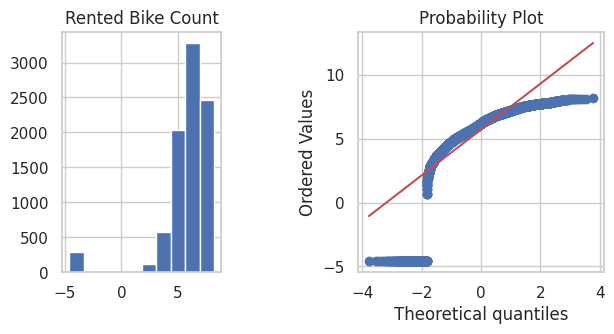

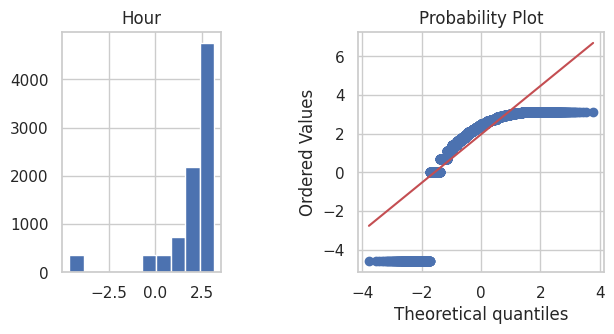

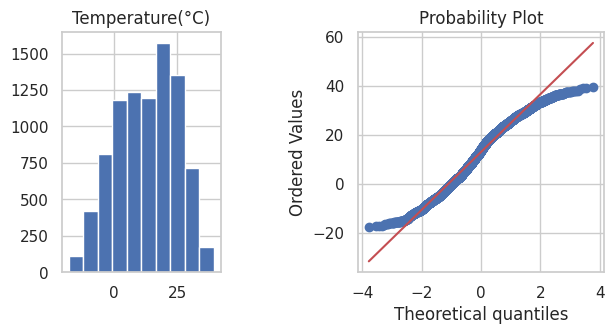

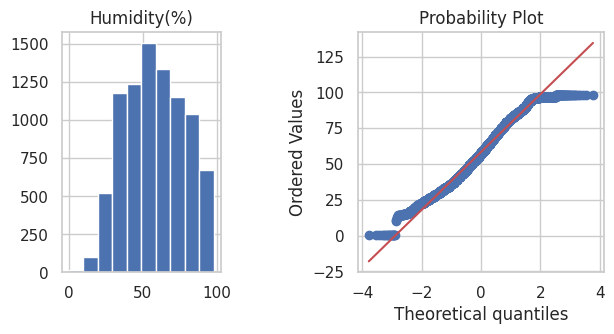

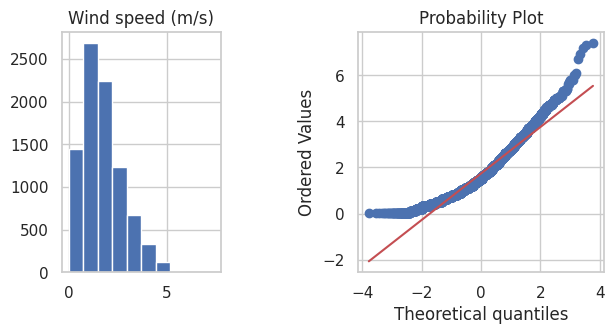

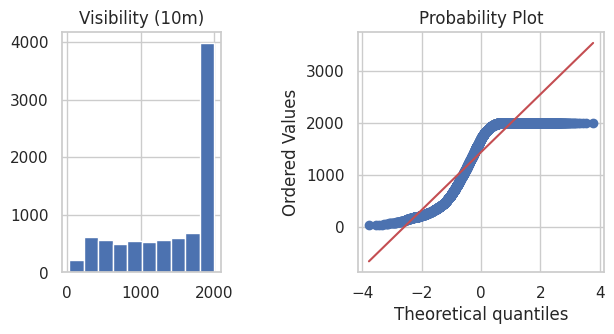

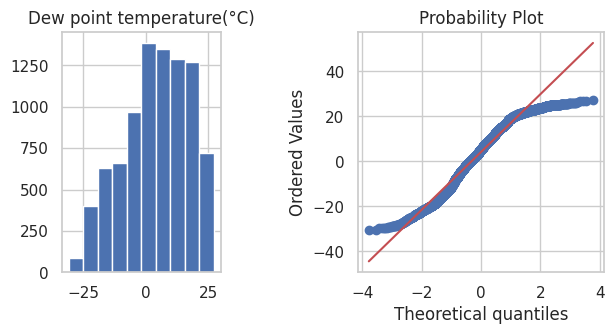

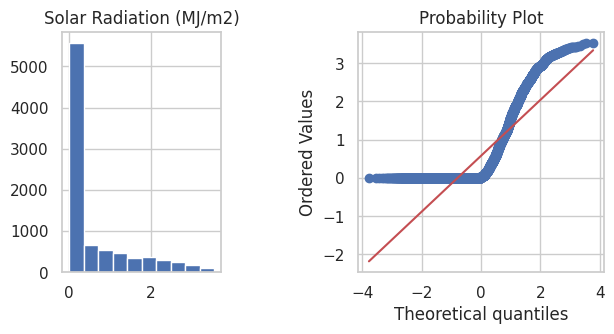

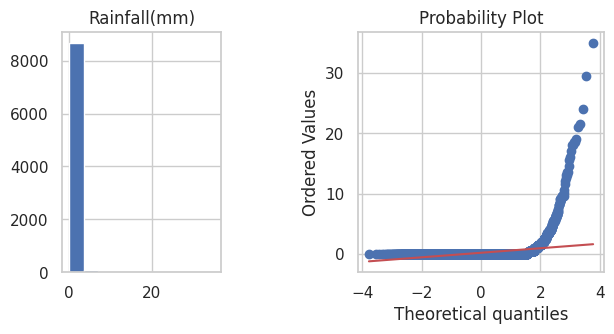

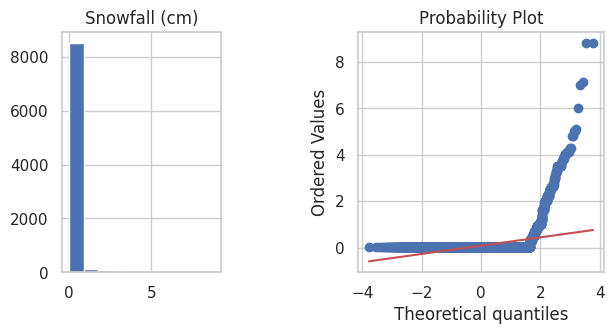

In [80]:
import scipy.stats as stats
import matplotlib.pyplot as plt


def plotvariable_log(df_log,variable):
  plt.figure(figsize=(7,7))
  plt.subplot(2,3,1)  #means in sub plot 2 row , 3 cloumns and first plot
  df_log[variable].hist(bins=10)
  plt.title(col)

   ## Q-Q plot
  plt.subplot(2,2,2)
  stats.probplot(df_log[variable],dist='norm',plot=plt)
  plt.show()

for col in numeric_features_log[0:10]:
  plotvariable_log(df_log,col)
  

In [81]:
df_box_cox=df.copy()

In [82]:
numeric_features_box_cox = df_box_cox.describe().columns
numeric_features_box_cox

Index(['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Month',
       'Year', 'day'],
      dtype='object')

In [83]:
for col in numeric_features_box_cox:
  df_box_cox[col]=df_box_cox[col]+.01

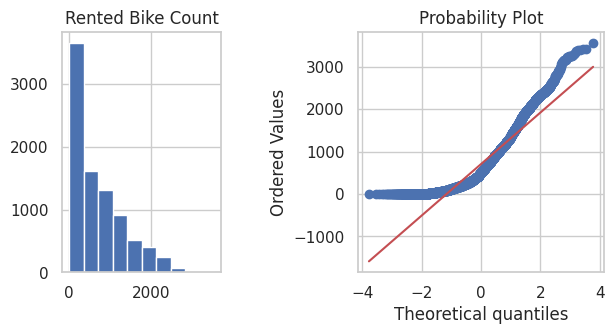

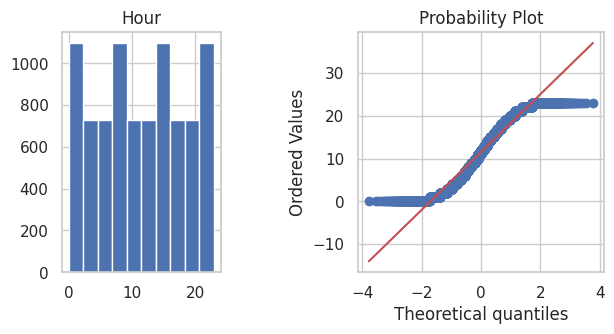

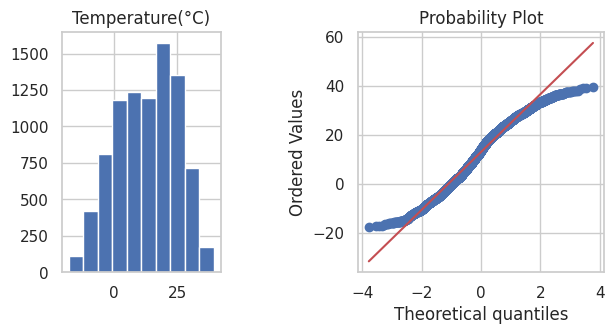

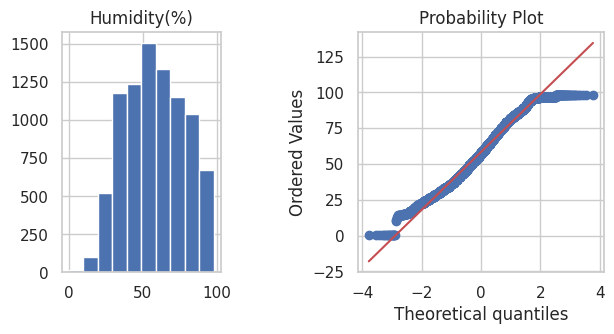

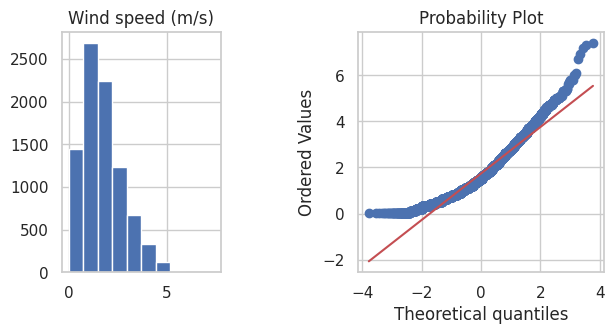

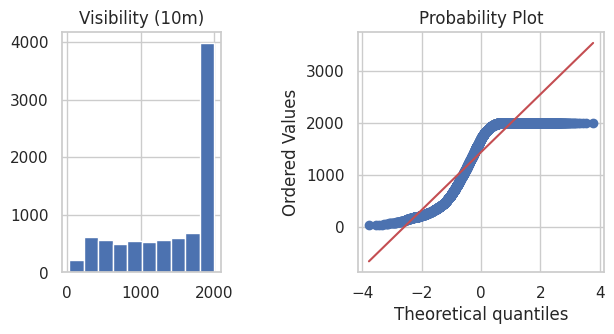

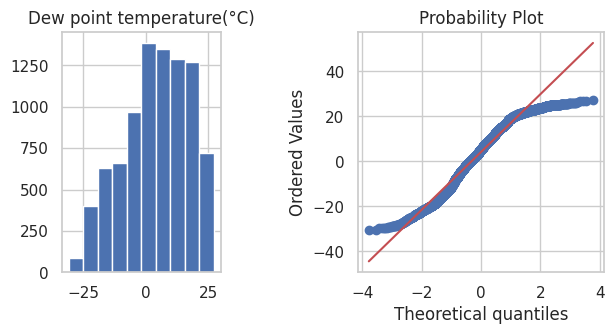

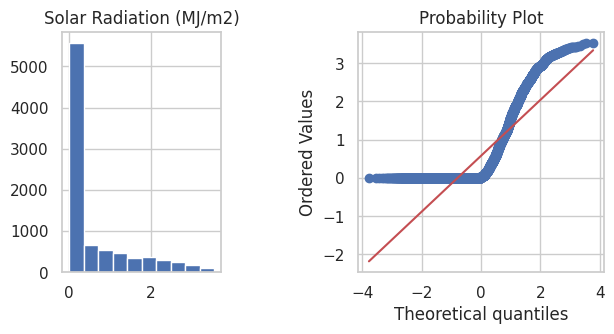

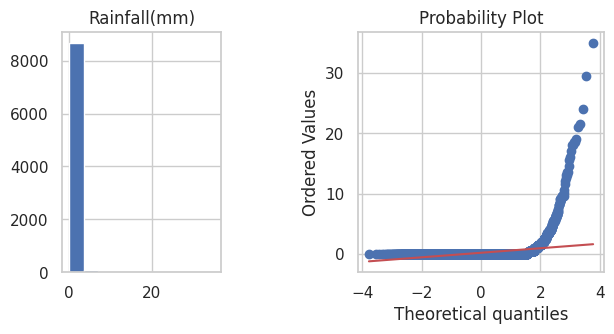

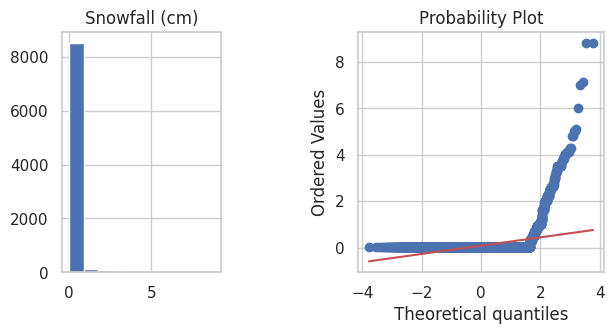

In [84]:
import scipy.stats as stats
import matplotlib.pyplot as plt


def plotvariable_box_cox(df_log,variable):
  plt.figure(figsize=(7,7))
  plt.subplot(2,3,1)  #means in sub plot 2 row , 3 cloumns and first plot
  df_box_cox[variable].hist(bins=10)
  plt.title(col)

   ## Q-Q plot
  plt.subplot(2,2,2)
  stats.probplot(df_box_cox[variable],dist='norm',plot=plt)
  plt.show()

for col in numeric_features_box_cox[0:10]:
  plotvariable_box_cox(df_box_cox,col)
  



---



---



---



---

